In [3]:
from daam import trace, set_seed
from diffusers import StableDiffusionPipeline
from models.diffuserpipeline import StableDiffusionPipelineForNegativePrompts
import torch
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "3"

def exp(prompt, negative_prompt, seed, steps, words, time_id, save_dir=None):
    model_id = 'stabilityai/stable-diffusion-2-base'
    device = 'cuda'
    pipe = StableDiffusionPipeline.from_pretrained(model_id, use_auth_token=True)
    pipe = pipe.to(device)
    time_id = [list(range(time_id_[0], time_id_[1] + 1)) for time_id_ in time_id]
    fig, axs = plt.subplots(1, len(time_id)+2, figsize=(5*(len(time_id)+1), 5))
    for ax in axs:
        ax.axis('off')
    fig.tight_layout()
    with torch.cuda.amp.autocast(dtype=torch.float16), torch.no_grad():
        out = pipe(prompt, num_inference_steps=steps, generator=set_seed(seed))
        axs[0].imshow(out.images[0])
        with trace(pipe) as tc:
            out = pipe(prompt, negative_prompt=negative_prompt, num_inference_steps=steps, generator=set_seed(seed))
            image = out.images[0]
            axs[1].imshow(image)
            for i, time_i in enumerate(time_id):
                heat_map = tc.compute_global_heat_map(time_idx=time_i)
                heat_map_word = heat_map.compute_word_heat_map(words)
                heat_map_word.plot_overlay(out.images[0], ax=axs[i+2])
                
    if save_dir:
        plt.savefig(save_dir)
         

Keyword arguments {'use_auth_token': True} are not expected by StableDiffusionPipeline and will be ignored.
Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00,  9.71it/s]


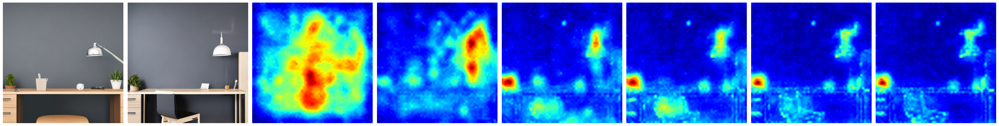

In [2]:
prompt = "Office wall above a wooden desk"
# negative_prompt = "laptop"
negative_prompt = "potted plant"
seed = 512891
steps = 30
words = "n:potted plant"
# words = "desk"
# save_dir = f'when/glasses_neg_{seed}.png'
# time_id = [[0,2],[3,5],[6,8],[9,11],[12,14],[15,17],[18,20],[21,23],[24,26],[27,29]]
#time_id = [[0,4],[5,9],[10,14],[15,19],[20,24],[25,29]]
time_id = [[0,3],[4,7],[8,11],[12,15],[16,19],[20,23]]
exp(prompt, negative_prompt, seed, steps, words, time_id)

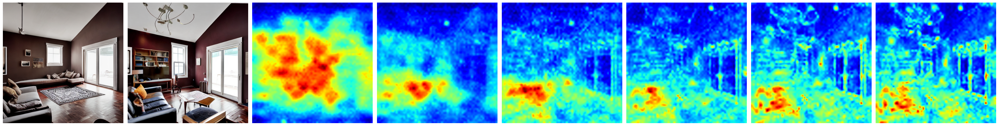

In [2]:
prompt = "a living room"
# negative_prompt = "laptop"
negative_prompt = "couch"
seed = 831745
steps = 30
words = "n:couch"
# words = "desk"
# save_dir = f'when/glasses_neg_{seed}.png'
# time_id = [[0,2],[3,5],[6,8],[9,11],[12,14],[15,17],[18,20],[21,23],[24,26],[27,29]]
#time_id = [[0,4],[5,9],[10,14],[15,19],[20,24],[25,29]]
time_id = [[0,3],[4,7],[8,11],[12,15],[16,19],[20,23]]
exp(prompt, negative_prompt, seed, steps, words, time_id)

Keyword arguments {'use_auth_token': True} are not expected by StableDiffusionPipeline and will be ignored.
Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 11.93it/s]


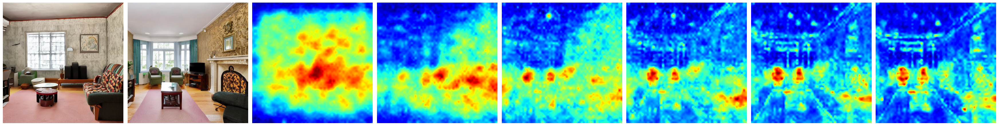

In [3]:
prompt = "a living room"
# negative_prompt = "laptop"
negative_prompt = "couch"
seed = 339136
steps = 30
words = "n:couch"
# words = "desk"
# save_dir = f'when/glasses_neg_{seed}.png'
# time_id = [[0,2],[3,5],[6,8],[9,11],[12,14],[15,17],[18,20],[21,23],[24,26],[27,29]]
#time_id = [[0,4],[5,9],[10,14],[15,19],[20,24],[25,29]]
time_id = [[0,3],[4,7],[8,11],[12,15],[16,19],[20,23]]
exp(prompt, negative_prompt, seed, steps, words, time_id)

Keyword arguments {'use_auth_token': True} are not expected by StableDiffusionPipeline and will be ignored.
Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 13.20it/s]


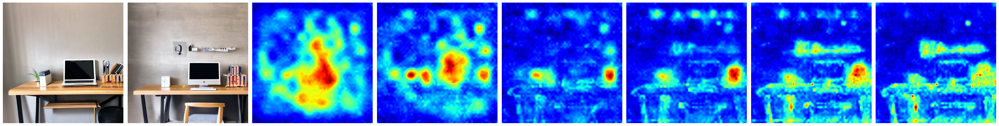

In [4]:
prompt = "Office wall above a wooden desk"
# negative_prompt = "laptop"
negative_prompt = "potted plant"
seed = 339136
steps = 30
words = "n:potted plant"
# words = "desk"
# save_dir = f'when/glasses_neg_{seed}.png'
# time_id = [[0,2],[3,5],[6,8],[9,11],[12,14],[15,17],[18,20],[21,23],[24,26],[27,29]]
#time_id = [[0,4],[5,9],[10,14],[15,19],[20,24],[25,29]]
time_id = [[0,3],[4,7],[8,11],[12,15],[16,19],[20,23]]
exp(prompt, negative_prompt, seed, steps, words, time_id)

Keyword arguments {'use_auth_token': True} are not expected by StableDiffusionPipeline and will be ignored.
Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 12.52it/s]


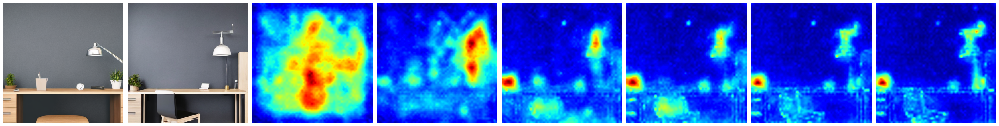

In [6]:
prompt = "Office wall above a wooden desk"
# negative_prompt = "laptop"
negative_prompt = "potted plant"
seed = 512891
steps = 30
words = "n:potted plant"
# words = "desk"
# save_dir = f'when/glasses_neg_{seed}.png'
# time_id = [[0,2],[3,5],[6,8],[9,11],[12,14],[15,17],[18,20],[21,23],[24,26],[27,29]]
#time_id = [[0,4],[5,9],[10,14],[15,19],[20,24],[25,29]]
time_id = [[0,3],[4,7],[8,11],[12,15],[16,19],[20,23]]
exp(prompt, negative_prompt, seed, steps, words, time_id)

Keyword arguments {'use_auth_token': True} are not expected by StableDiffusionPipeline and will be ignored.
Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 12.97it/s]


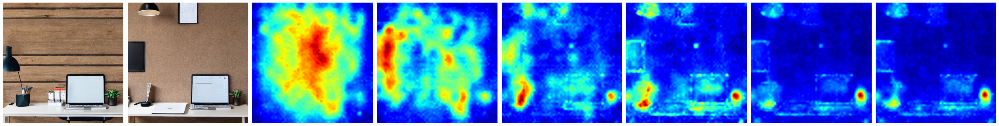

In [7]:
prompt = "Office wall above a wooden desk"
# negative_prompt = "laptop"
negative_prompt = "potted plant"
seed = 998124
steps = 30
words = "n:potted plant"
# words = "desk"
# save_dir = f'when/glasses_neg_{seed}.png'
# time_id = [[0,2],[3,5],[6,8],[9,11],[12,14],[15,17],[18,20],[21,23],[24,26],[27,29]]
#time_id = [[0,4],[5,9],[10,14],[15,19],[20,24],[25,29]]
time_id = [[0,3],[4,7],[8,11],[12,15],[16,19],[20,23]]
exp(prompt, negative_prompt, seed, steps, words, time_id)